In [1]:
import cv2
import numpy as np
import pywt

import matplotlib.pyplot as plt

In [2]:
plt.style.use('seaborn-v0_8')
# plt.rcParams["grid.linestyle"] = "--"
plt.rcParams["grid.alpha"] = 0

plt.rcParams["figure.figsize"] = (30, 10)

for ticks in ["xtick", "ytick"]:
    for side in ["top", "bottom", "left", "right"]:
        try:
            plt.rcParams[f"{ticks}.label{side}"] = False
        except KeyError:
            pass

In [3]:
buffy = cv2.imread("img/buffy_headphones.png")
buffy_rgb = cv2.cvtColor(buffy, cv2.COLOR_BGR2RGB)
buffy_gray = cv2.cvtColor(buffy, cv2.COLOR_RGB2GRAY)

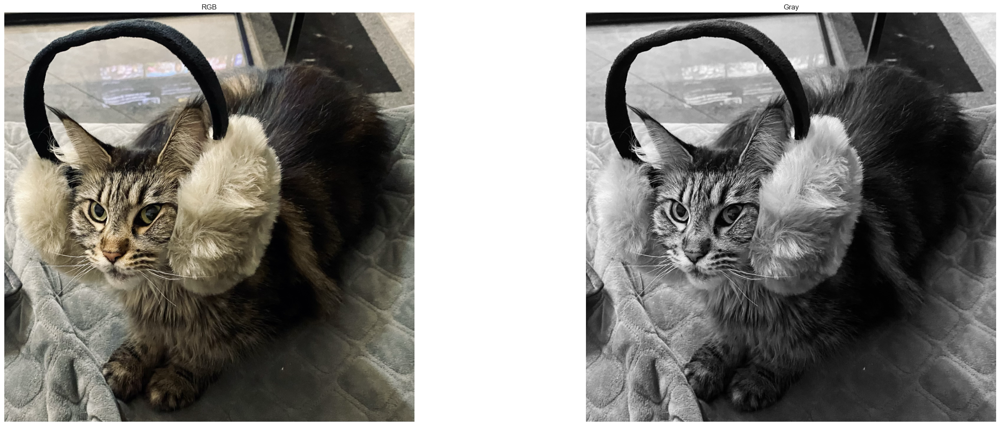

In [4]:
plt.subplot(1, 2, 1).set_title("RGB")
plt.imshow(buffy_rgb)

plt.subplot(1, 2, 2).set_title("Gray")
plt.imshow(buffy_gray, cmap="gray")

plt.tight_layout()

In [5]:
# pywt.wavelist(kind="discrete")

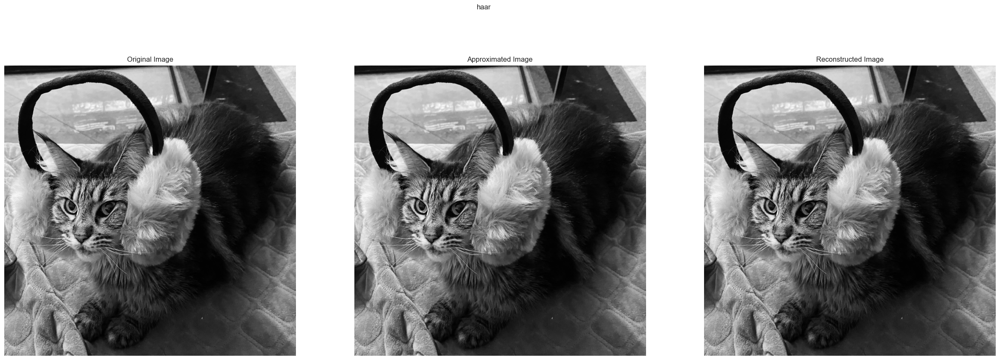

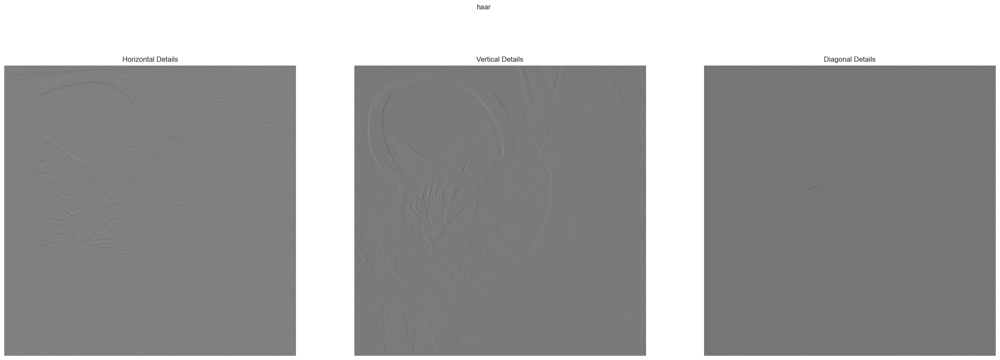

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Filtering:


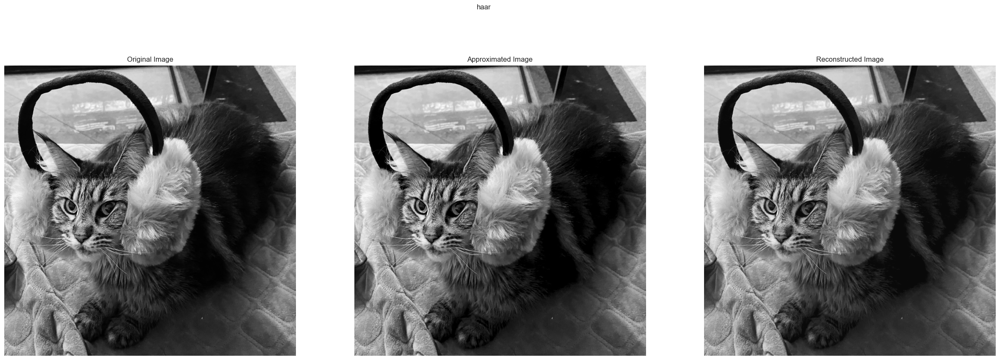

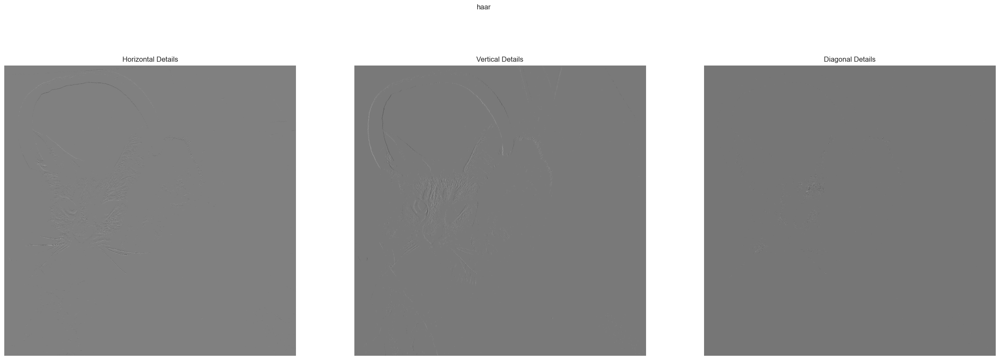

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


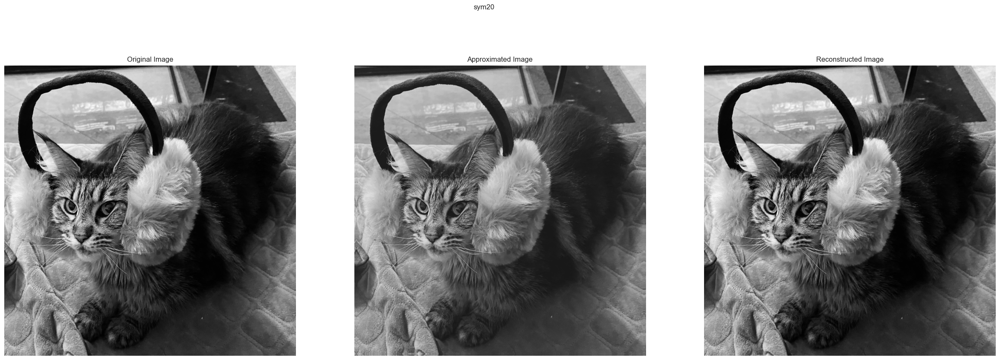

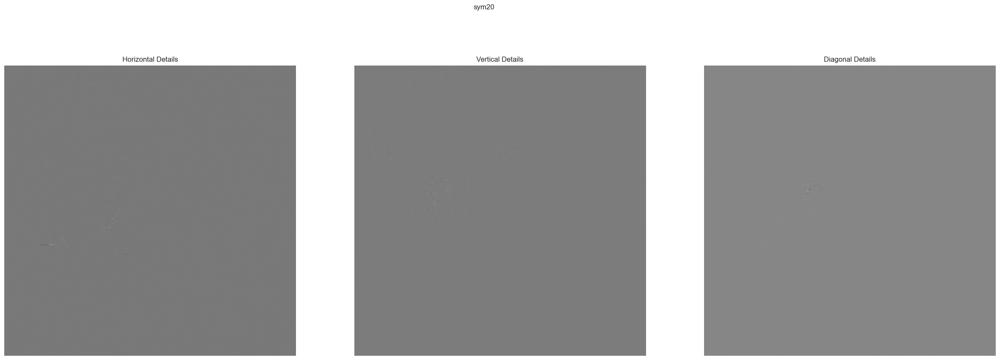

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Filtering:


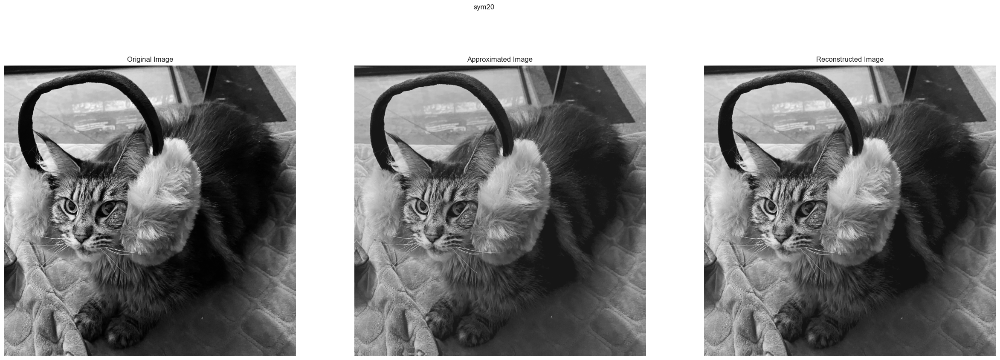

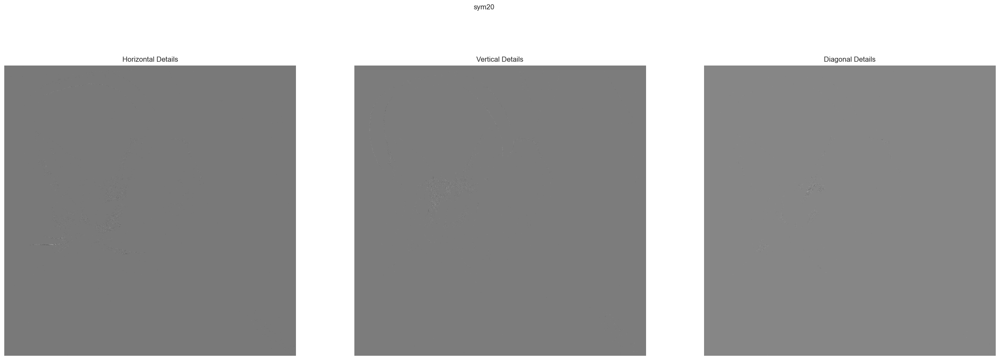

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


In [6]:
to_filter = False

for w in ["haar", "haar", "sym20", "sym20"]:
    coeffs = pywt.dwt2(buffy_gray, w)

    if to_filter:
        threshold = 20
        coeffs = [np.where(np.abs(c) > threshold, c, 0) for c in coeffs]
        print("Filtering:")
    to_filter = not to_filter

    approx, (horiz, vert, diag) = coeffs
    reconstructed = pywt.idwt2(coeffs, w)

    for i, (image, title) in enumerate(zip(
            [buffy_gray, approx, reconstructed],
            ["Original", "Approximated", "Reconstructed"]
    ), 1):
        plt.subplot(1, 3, i).set_title(f"{title} Image")
        plt.imshow(image, cmap="gray")

    plt.suptitle(w)
    plt.show()

    for i, (details, title) in enumerate(zip(
            [horiz, vert, diag],
            ["Horizontal", "Vertical", "Diagonal"]
    ), 1):
        plt.subplot(1, 3, i).set_title(f"{title} Details")
        plt.imshow(details, cmap="gray")

    plt.suptitle(w)
    plt.show()

    print("-" * 175)

In [7]:
def calc_padding_for_axis(axis_shape: int, mult: int):
    pad = (mult - axis_shape % mult) // 2
    return pad, pad

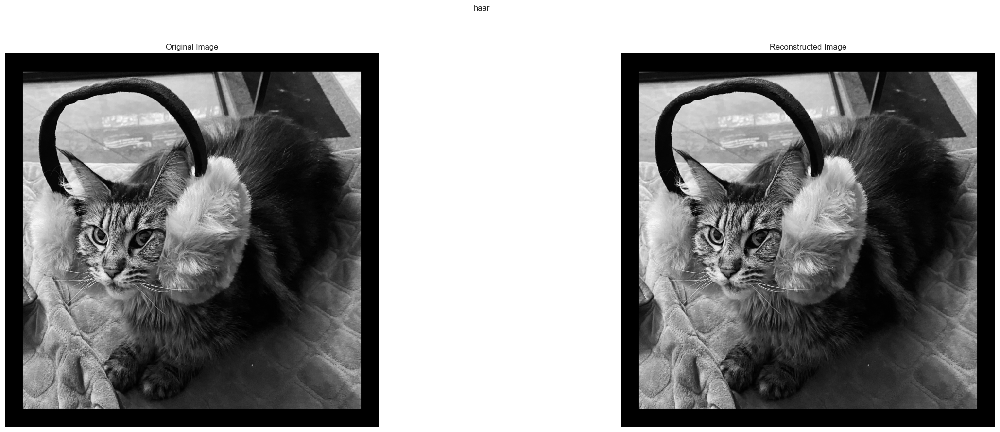

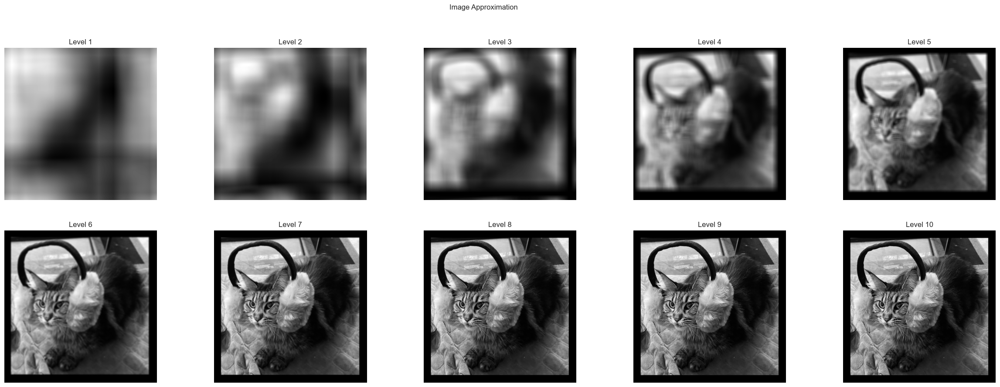

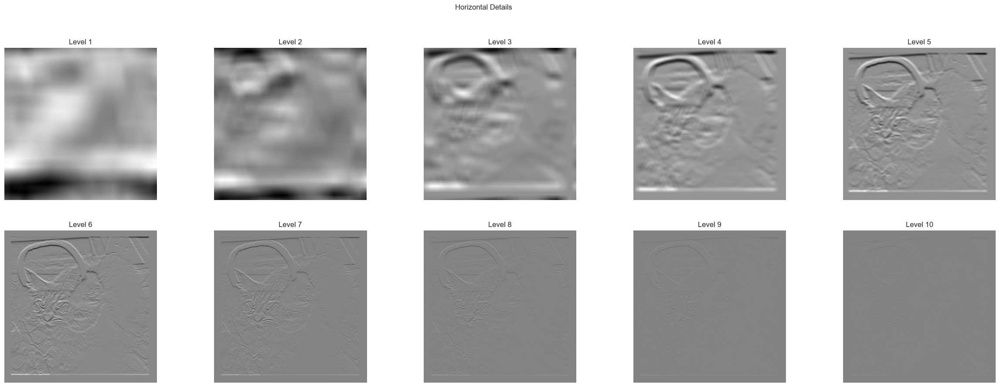

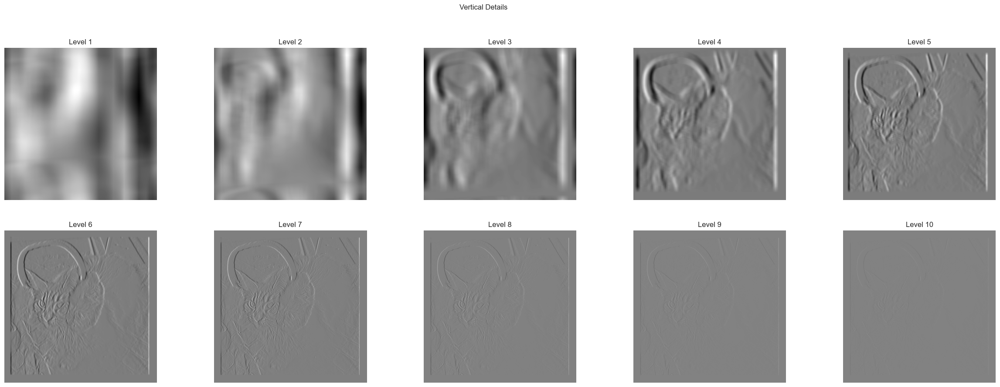

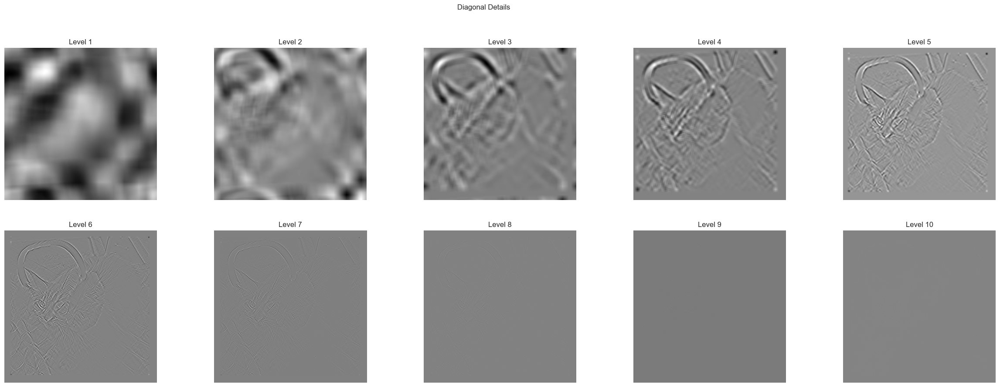

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


In [9]:
for w in ["haar"]:
    level = 10
    padding_shapes = tuple(map(lambda x: calc_padding_for_axis(x, mult=2 ** level), buffy_gray.shape))
    padded_image = np.pad(buffy_gray, padding_shapes)

    coeffs = pywt.swt2(padded_image, w, level=level)
    reconstructed = pywt.iswt2(coeffs, w)

    for i, (image, title) in enumerate(zip(
            [padded_image, reconstructed],
            ["Original", "Reconstructed"]
    ), 1):
        plt.subplot(1, 2, i).set_title(f"{title} Image")
        plt.imshow(image, cmap="gray")

    plt.suptitle(w)
    plt.show()

    flattened_coeffs = [(a, b, c, d) for a, (b, c, d) in coeffs]
    approx_levels, horiz_levels, vert_levels, diag_levels = list(zip(*flattened_coeffs))

    for i, (coeffs_list, title) in enumerate(zip(
            [approx_levels, horiz_levels, vert_levels, diag_levels],
            ["Image Approximation", "Horizontal Details", "Vertical Details", "Diagonal Details"]
        )):

        for c_i, c in enumerate(coeffs_list, 1):
            plt.subplot(2, level // 2, c_i).set_title(f"Level {c_i}")
            plt.imshow(c, cmap="gray")

        plt.suptitle(title)
        plt.show()

    print("-" * 175)